<a href="https://colab.research.google.com/github/OmerRosen/Kaggle/blob/main/IMDB_2022_Hit_or_Flop_Data_Exploration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Exploration

In [14]:
import requests
from IPython.core.display import HTML
import json
from time import sleep
import re
import requests
from bs4 import BeautifulSoup
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import os
import time
import traceback
from sklearn.linear_model import LinearRegression
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler


<br><b>Observing The Data</b><br>
We will go over our different columns, make note of their scales and divide them into columns types for later preprocessing.

In [15]:
imdb_movie_dataset_path = "/content/drive/My Drive/Harvard HW/Course 4 - Final Project/imdb_movie_dataset_raw.csv"
if os.path.exists(imdb_movie_dataset_path):
  imdb_movie_raw_dataset = pd.read_csv(imdb_movie_dataset_path, index_col=['movie_id'])
  imdb_movie_raw_list = imdb_movie_raw_dataset.T.to_dict()
  
else:
  imdb_movie_raw_list = {}
  imdb_movie_raw_dataset = pd.DataFrame(imdb_movie_raw_list)

print(f"imdb_movie_raw_list contains {len(imdb_movie_raw_list)} records")
imdb_movie_raw_dataset.head(3)

imdb_movie_raw_list contains 628 records


,_finshed_successfully,budget_usd,runtime_min,movie_name,title_length,movie_desc_length,rating_catg,movie_year,budget_currency,cast_count_total,...,language_welsh,genere_musical,language_croatian,language_wolof,language_latvian,language_hausa,language_norwegian,language_sioux,language_thai,language_albanian
movie_id,,,,,,,,,,,,,,,,,,,,,
tt1630029,True,350000000.0,192.0,Avatar: The Way of Water,5,40,PG-13,2022,USD,2199,...,False,False,False,False,False,False,False,False,False,False
tt6710474,True,14300000.0,139.0,Everything Everywhere All at Once,5,31,R,2022,USD,564,...,False,False,False,False,False,False,False,False,False,False
tt10640346,True,78000000.0,189.0,Babylon,1,28,R,2022,USD,1067,...,False,False,False,False,False,False,False,False,False,False


In [16]:
imdb_movie_raw_dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
budget_usd,152.0,5.005516e+07,6.347006e+07,4000.0,5000000.00,23500000.0,7.500000e+07,3.500000e+08
runtime_min,625.0,9.980320e+01,1.689318e+01,48.0,89.00,97.0,1.070000e+02,1.920000e+02
title_length,628.0,2.641720e+00,1.499807e+00,1.0,2.00,2.0,3.000000e+00,1.200000e+01
movie_desc_length,628.0,2.854140e+01,9.039513e+00,3.0,21.00,28.0,3.700000e+01,5.100000e+01
movie_year,628.0,2.022000e+03,0.000000e+00,2022.0,2022.00,2022.0,2.022000e+03,2.022000e+03
cast_count_total,628.0,2.641274e+02,3.476007e+02,0.0,85.00,150.5,3.165000e+02,2.938000e+03
cast_count_director,628.0,1.122611e+00,6.050807e-01,0.0,1.00,1.0,1.000000e+00,1.100000e+01
cast_count_writer,628.0,2.609873e+00,2.064903e+00,0.0,1.00,2.0,3.000000e+00,1.500000e+01
cast_count_cast,628.0,3.848567e+01,3.715386e+01,0.0,18.00,29.0,4.500000e+01,4.500000e+02
cast_count_producer,628.0,1.209395e+01,1.181769e+01,0.0,6.00,10.0,1.400000e+01,1.670000e+02


## Categorize Column Types

<br>Upon looking at our data we can split it into the following types:<br>
1. Textual Columns - We will not be able to use them as they appear currently and they will be dropped for now.<br>
2. Numerical Columns - We will need to scale these later on.
3. Categorical Columns - We will need to convert these using One-Hot-Encoding.
4. Binary Columns
5. Result Column - This contain our Y values - Opening Week, Gross revenue and Metascore

In [17]:
# Predictor columns:
pred_metascore = ['pred_metascore']
pred_opening_weekend_us_canada = ['pred_opening_weekend_us_canada']
pred_gross_us_canada = ['pred_gross_us_canada']


columns_to_drop = ['movie_name','_finshed_successfully','artist','uri','movie_id','movie_year','pred_user_review_count','pred_critic_review_count','pred_total_vote_count','pred_gross_worldwide']
categorical_columns = []
binary_columns = []
numerical_columns = []
uncategorized_columns = []

binary_threshold = 20 # Below 10 positive values this column will be dropped
numerical_threshold = 30 # Below 10 total values this column will be dropped

dtype_dict = imdb_movie_raw_dataset.dtypes
for col, col_type in dtype_dict.items():
  if col not in columns_to_drop+pred_metascore+pred_opening_weekend_us_canada+pred_gross_us_canada:
    # handle binary columns:
    if col_type == bool:

      true_count = imdb_movie_raw_dataset[col].sum()
      
      if true_count<binary_threshold:
        print(f"dropping column {col} since it has only {true_count} actual records")
        columns_to_drop.append(col)
      else:
        binary_columns.append(col)
    
    # handle numerical columns:
    elif col_type in [float,int] :
      
      col_sum = imdb_movie_raw_dataset[col].sum()
      if col_sum<numerical_threshold:
        print(f"dropping column {col} since it has only {col_sum} sum values records")
        columns_to_drop.append(col)
      else:
        numerical_columns.append(col)

    elif col_type == object:
      #Try to convert to float:
      try:
        imdb_movie_raw_dataset[col] = imdb_movie_raw_dataset[col].astype(float)
        numerical_columns.append(col)
        print(f"col {col} was converted from type 'object' to type 'float'")
      # Check if categorical:
      except:
        if len(imdb_movie_raw_dataset[col].unique())<20:
          print(f"Col {col} is a categorical type column with {len(imdb_movie_raw_dataset[col].unique())} unique values:\n      {imdb_movie_raw_dataset[col].unique()}")
          categorical_columns.append(col)
        else:
          print(f"Unable to categorize column {col}")
          uncategorized_columns.append(col)
    else:
      print(col, col_type)
      uncategorized_columns.append(col)

predictor_columns = categorical_columns + binary_columns + numerical_columns
print(f"\nOur Dataset has: \n  {len(categorical_columns)} categorical_columns. \n  {len(binary_columns)} binary_columns. \n  {len(numerical_columns)} numerical_columns. \n   {len(uncategorized_columns)} uncategorized_columns. \n")

Col rating_catg is a categorical type column with 4 unique values:
      ['PG-13' 'R' 'Unrated' 'G']
Col budget_currency is a categorical type column with 3 unique values:
      ['USD' 'EUR' 'CAD']
dropping column crew_nonbinary_count since it has only 2 sum values records
dropping column language_mandarin since it has only 1 actual records
dropping column language_cantonese since it has only 3 actual records
dropping column genere_history since it has only 10 actual records
dropping column language_italian since it has only 9 actual records
dropping column language_hungarian since it has only 1 actual records
dropping column language_japanese since it has only 2 actual records
dropping column language_russian since it has only 3 actual records
dropping column language_swedish since it has only 1 actual records
dropping column language_german since it has only 14 actual records
dropping column language_greek since it has only 5 actual records
dropping column language_tagalog since it h

In [18]:
def get_log_of_amounts(amount_series):
  amount_series_log = []
  for val in amount_series:
    if val==None:
      amount_series_log.append(val)
    else:
      amount_series_log.append(np.log(val))
  return amount_series_log

In [19]:
data = imdb_movie_raw_dataset[predictor_columns+['movie_name']].copy()
y_metascore = imdb_movie_raw_dataset['pred_metascore']
y_opening_weekend_us_canada = imdb_movie_raw_dataset['pred_opening_weekend_us_canada']
y_opening_weekend_us_canada_log = get_log_of_amounts(y_opening_weekend_us_canada)

y_gross_us_canada = imdb_movie_raw_dataset['pred_gross_us_canada']
y_gross_us_canada_log  = get_log_of_amounts(y_gross_us_canada)


## Missing Data

In [20]:
nan_counts = data.isna().sum()
nan_counts_sorted = nan_counts.sort_values(ascending=False)


# print the results
print(nan_counts_sorted)


budget_usd                       476
crew_age_avg                      49
runtime_min                        3
cast_count_make_up_department      0
cast_count_production_manager      0
                                ... 
cast_count_composer                0
cast_count_cinematographer         0
cast_count_editor                  0
cast_count_casting_director        0
movie_name                         0
Length: 66, dtype: int64


In [21]:
data.tail(3)

,rating_catg,budget_currency,genere_action,genere_adventure,genere_fantasy,language_english,genere_comedy,genere_drama,language_spanish,language_french,...,language__count,main_crew_count,crew_age_avg,crew_age_missing,crew_female_count,crew_prestige_wins,crew_prestige_nominations,crew_awards_wins,crew_awards_nominations,movie_name
movie_id,,,,,,,,,,,,,,,,,,,,,
tt12126628,Unrated,USD,False,False,False,True,True,False,False,False,...,1,6,58.0,4,2,0,0,126,54,Jack Be Nimble
tt24251826,Unrated,USD,False,False,False,True,False,True,False,False,...,1,7,NaN,7,0,0,0,0,0,Secrets
tt22176928,Unrated,USD,False,False,False,True,True,False,False,False,...,1,5,38.0,4,0,0,0,1,0,Uninvited for the Holidays


For any missing currency, assume USD is referred

In [22]:

data['budget_currency'].fillna('USD', inplace=True)

### Imputation

In [23]:
data[['budget_usd','crew_age_avg','crew_age_avg']].describe()

,budget_usd,crew_age_avg,crew_age_avg
count,1.520000e+02,579.000000,579.000000
mean,5.005516e+07,46.285188,46.285188
std,6.347006e+07,11.262031,11.262031
min,4.000000e+03,14.000000,14.000000
25%,5.000000e+06,38.550000,38.550000
50%,2.350000e+07,45.500000,45.500000
75%,7.500000e+07,53.083333,53.083333
max,3.500000e+08,94.800000,94.800000


In [24]:
nan_mask = data['budget_usd'].isna()
nan_rows = data.loc[nan_mask]
nan_count = data['budget_usd'].isna().sum()
print(f"There are {nan_count} rows (out of {data.shape[0]}) with NaN values in the 'budget_usd' column.")

nan_rows[['budget_usd','movie_name']].head(10)

There are 476 rows (out of 628) with NaN values in the 'budget_usd' column.


,budget_usd,movie_name
movie_id,,
tt11813216,NaN,The Banshees of Inisherin
tt19770238,NaN,Aftersun
tt18925334,NaN,Pearl
tt8110652,NaN,Bodies Bodies Bodies
tt12758486,NaN,Chevalier
tt21440780,NaN,How to Blow Up a Pipeline
tt13669038,NaN,Women Talking
tt14402146,NaN,Empire of Light
tt3447590,NaN,Roald Dahl's Matilda the Musical


Use IterativeImputer in order to fill in gaps regarding Budget.

In [25]:
# Save a backup copy
budget_usd_original = data['budget_usd'].copy()

In [26]:
scaler = StandardScaler()

data['budget_usd'] = scaler.fit_transform(data[['budget_usd']])

imputer = KNNImputer(n_neighbors=10, weights='distance')
X_imputed = pd.DataFrame(imputer.fit_transform(data[numerical_columns+binary_columns]), columns=numerical_columns+binary_columns, index=data.index)
X_imputed['budget_usd'] = scaler.inverse_transform(X_imputed[['budget_usd']]).astype(int)



Check to see that original budget_usd values were not shifted or distorted

In [27]:
print(budget_usd_original[0:6])
print(X_imputed['budget_usd'].head(5))

movie_id
tt1630029     350000000.0
tt6710474      14300000.0
tt10640346     78000000.0
tt9764362      35000000.0
tt13833688     10000000.0
tt12593682     85900000.0
Name: budget_usd, dtype: float64
movie_id
tt1630029     350000000
tt6710474      14300000
tt10640346     78000000
tt9764362      35000000
tt13833688     10000000
Name: budget_usd, dtype: int64


Check to see that the imputed numbers make sense

In [28]:
print(budget_usd_original[-10:])
print(X_imputed['budget_usd'].tail(10))

movie_id
tt22940628         NaN
tt25396646         NaN
tt12973010         NaN
tt7875666          NaN
tt9169280          NaN
tt10650376         NaN
tt12757372      7000.0
tt12126628    250000.0
tt24251826     60000.0
tt22176928         NaN
Name: budget_usd, dtype: float64
movie_id
tt22940628    2742144
tt25396646     117879
tt12973010    8836796
tt7875666      269055
tt9169280      416369
tt10650376     705252
tt12757372       7000
tt12126628     250000
tt24251826      60000
tt22176928     350160
Name: budget_usd, dtype: int64


<br><b>Data Balance</b><br>
We will observe the ratio in our y values, in addition to our categorical and binary columns, and observe if there is an imbalance that requires intervention.



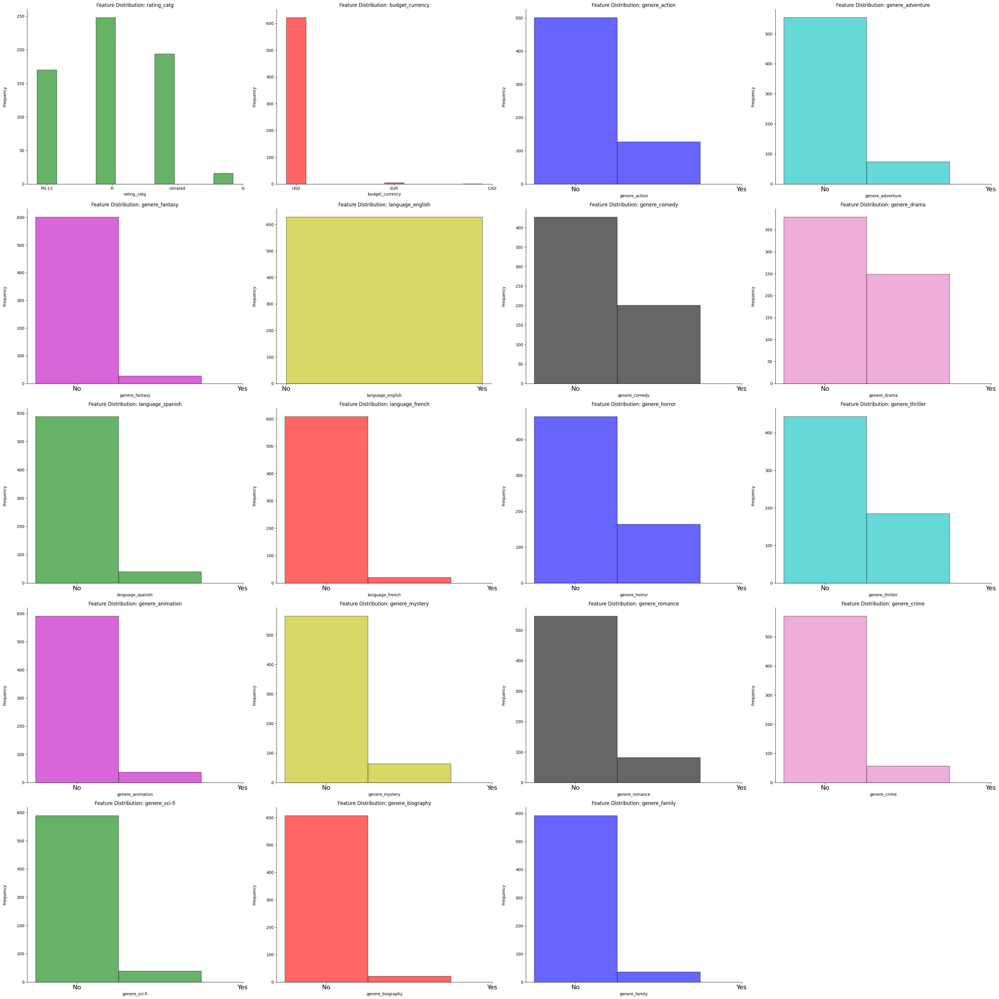

In [29]:
import math

cols_for_histogram = categorical_columns +binary_columns
feature_num = len(cols_for_histogram)

plot_per_row = 4
row_num = math.ceil(feature_num/plot_per_row)

fig = plt.gcf()
fig.set_size_inches(35,35)

c_list = ['g','r','b','c','m','y','k','tab:pink','g','r','b','c','m','y','k','tab:pink','g','r','b','c','m','y','k','tab:pink','g','r','b','c','m','y','k','tab:pink','g','r','b','c','m','y','k','tab:pink','g','r','b','c','m','y','k','tab:pink']


for i,col in enumerate(cols_for_histogram):
    col_vals = data[[col]]
    col_vals_series = data[col]
    unique_vals = len(col_vals_series.unique())
    
    if col in binary_columns:
      col_vals_series = data[col].astype(int)
      bin_count = unique_vals
    else:
      bin_count = None
    
    
    #print(i,col,col_vals.sum(),bin_count)
    ax = fig.add_subplot(row_num,plot_per_row,i+1)
    height, bins, patches = ax.hist(x=col_vals_series, bins=bin_count, alpha=0.6, label=f"Feature {col}",density=False,edgecolor='k', color=c_list[i], align='left')
    
    if col in binary_columns:
      ax.set_xticks((0,1), labels=('No', 'Yes'), fontsize=16)
    
    ax.set_xlabel(col)
    ax.set_ylabel('Frequency',rotation=90,labelpad=25)
    ax = plt.gca()
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    ax.set_title(f'Feature Distribution: {col}')

plt.tight_layout()
plt.plot;

<br><b>Predictor Corralation</b><br>
We will observe the relationship between each predictor individually and attempt to see if any noteable correlation are spotted between the feature and whether or not the song is a hit.<br><br>

In the plot below, we can notice some interesting relationships:<br>
1. Dancability - If your song has less than ~0.2 dancability rate you will not become a hit.
2. Loudness - There is a correlation between loudness and success
3. Speechness - If your speech-to-music ration is higher than 0.45 it decreases your odds significantly at having a hit.
4. Duration - The longer your song lasts the fewer people will listen to it again.
5. Sections - The number of sections the particular track has appear to have an effect on its success rate.

In [30]:
import math
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm


In [31]:
X = data[categorical_columns +binary_columns + numerical_columns].copy()

<ipython-input-32-c0e623cf6a59>:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('RdYlGn')


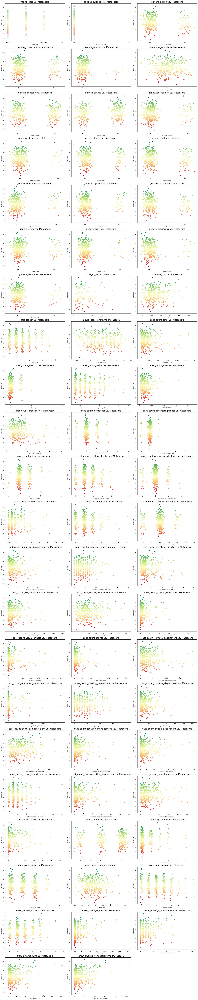

In [32]:
color_map = []

y_pred = y_metascore

for val in y_pred:
    if val==1:
        color_map.append('g')
    else:
        color_map.append('r')
        
coeff_num = len(predictor_columns)
plot_col_num = 3
row_num = math.ceil(coeff_num/plot_col_num)

fig = plt.gcf()
fig.set_size_inches(20,100)

for i,pred_col in enumerate(predictor_columns):
    
    sigma = 0.1
    
    mu =0.001
    
    # generate normally distributed samples
    y_noise = sigma * np.random.randn(X.shape[0]) + mu
    x_noise = sigma * np.random.randn(X.shape[0]) + mu
    
    ax = fig.add_subplot(row_num,plot_col_num,i+1)
    x_val = X[pred_col]
    if pred_col in binary_columns:
        x_val = X[pred_col]+x_noise
        ax.set_xticks((0,1), labels=('No', 'Yes'))
        
    if pred_col in categorical_columns:
        x_val = X[pred_col]

    if pred_col in numerical_columns:
        x_val = X[pred_col]+x_noise
    
    cmap = cm.get_cmap('RdYlGn')

    ax.scatter(x_val,y_pred, cmap=cmap, c=y_pred)
    ax.set_xlabel(f'{pred_col}', fontsize=8)
    ax.set_ylabel(f'Metascore', fontsize=8)
    #ax.set_xlabel('Hit', fontsize=8)
    #ax.set_xticks((0,1), labels=('No', 'Yes'), fontsize=14)
    ax = plt.gca()
    ax.set_title(f'{pred_col} vs. Metascore').set_size(16)

    
plt.tight_layout()
plt.plot;

<ipython-input-33-7367b255be26>:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('RdYlGn')


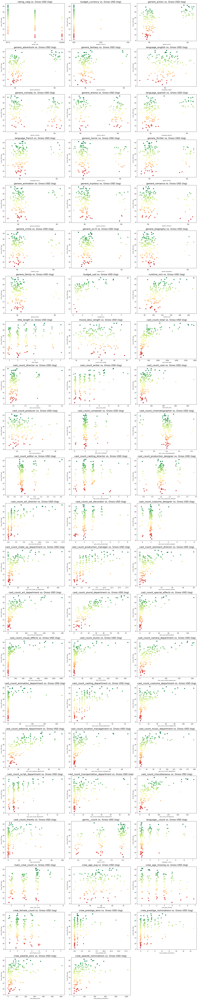

In [33]:
color_map = []

y_pred = y_gross_us_canada_log

for val in y_pred:
    if val==1:
        color_map.append('g')
    else:
        color_map.append('r')
        
coeff_num = len(predictor_columns)
plot_col_num = 3
row_num = math.ceil(coeff_num/plot_col_num)

fig = plt.gcf()
fig.set_size_inches(20,100)

for i,pred_col in enumerate(predictor_columns):
    
    sigma = 0.1
    
    mu =0.001
    
    # generate normally distributed samples
    y_noise = sigma * np.random.randn(X.shape[0]) + mu
    x_noise = sigma * np.random.randn(X.shape[0]) + mu
    
    ax = fig.add_subplot(row_num,plot_col_num,i+1)
    x_val = X[pred_col]
    if pred_col in binary_columns:
        x_val = X[pred_col]+x_noise
        ax.set_xticks((0,1), labels=('No', 'Yes'))
        
    if pred_col in categorical_columns:
        x_val = X[pred_col]

    if pred_col in numerical_columns:
        x_val = X[pred_col]+x_noise
    
    cmap = cm.get_cmap('RdYlGn')

    ax.scatter(x_val,y_pred, cmap=cmap, c=y_pred)
    ax.set_xlabel(f'{pred_col}', fontsize=8)
    ax.set_ylabel(f'Gross USD (log)', fontsize=8)
    #ax.set_xlabel('Hit', fontsize=8)
    #ax.set_xticks((0,1), labels=('No', 'Yes'), fontsize=14)
    ax = plt.gca()
    ax.set_title(f'{pred_col} vs. Gross USD (log)').set_size(16)

    
plt.tight_layout()
plt.plot;

<ipython-input-34-1352ffc45c15>:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('RdYlGn')


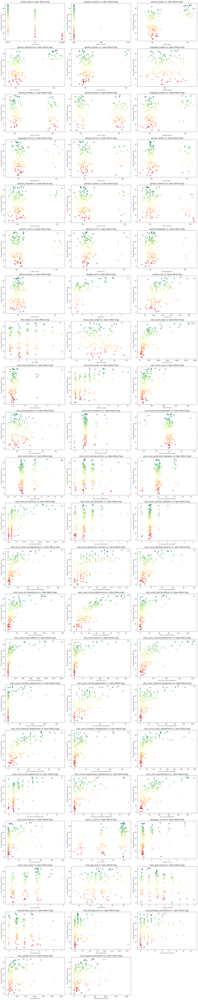

In [34]:
color_map = []

y_pred = y_opening_weekend_us_canada_log

for val in y_pred:
    if val==1:
        color_map.append('g')
    else:
        color_map.append('r')
        
coeff_num = len(predictor_columns)
plot_col_num = 3
row_num = math.ceil(coeff_num/plot_col_num)

fig = plt.gcf()
fig.set_size_inches(20,100)

for i,pred_col in enumerate(predictor_columns):
    
    sigma = 0.1
    
    mu =0.001
    
    # generate normally distributed samples
    y_noise = sigma * np.random.randn(X.shape[0]) + mu
    x_noise = sigma * np.random.randn(X.shape[0]) + mu
    
    ax = fig.add_subplot(row_num,plot_col_num,i+1)
    x_val = X[pred_col]
    if pred_col in binary_columns:
        x_val = X[pred_col]+x_noise
        ax.set_xticks((0,1), labels=('No', 'Yes'))
        
    if pred_col in categorical_columns:
        x_val = X[pred_col]

    if pred_col in numerical_columns:
        x_val = X[pred_col]+x_noise
    
    cmap = cm.get_cmap('RdYlGn')

    ax.scatter(x_val,y_pred, cmap=cmap, c=y_pred)
    ax.set_xlabel(f'{pred_col}', fontsize=8)
    ax.set_ylabel(f'Opening Weekend USD (log)', fontsize=8)
    #ax.set_xlabel('Hit', fontsize=8)
    #ax.set_xticks((0,1), labels=('No', 'Yes'), fontsize=14)
    ax = plt.gca()
    ax.set_title(f'{pred_col} vs. Open Wknd (log)').set_size(13)

    
plt.tight_layout()
plt.plot;

## One Hot Encoding

<br><b>One Hot Encoding</b><br>
We will convert all of our categorical columns into binary columns.

In [35]:
for i,col in enumerate(categorical_columns):
    onehot = pd.get_dummies(X[col], prefix=col)
    if i==0:
        X_ohe = X.join(onehot)
    else:
        X_ohe = X_ohe.join(onehot)
    X_ohe = X_ohe.drop([col], axis=1)
    print(f"Col {col} - Converted into {onehot.shape[1]} hot-encoded columns")
X_ohe

Col rating_catg - Converted into 4 hot-encoded columns
Col budget_currency - Converted into 3 hot-encoded columns


,genere_action,genere_adventure,genere_fantasy,language_english,genere_comedy,genere_drama,language_spanish,language_french,genere_horror,genere_thriller,...,crew_prestige_nominations,crew_awards_wins,crew_awards_nominations,rating_catg_G,rating_catg_PG-13,rating_catg_R,rating_catg_Unrated,budget_currency_CAD,budget_currency_EUR,budget_currency_USD
movie_id,,,,,,,,,,,,,,,,,,,,,
tt1630029,True,True,True,True,False,False,False,False,False,False,...,3,215,332,0,1,0,0,0,0,1
tt6710474,True,True,False,True,True,False,False,False,False,False,...,1,610,486,0,0,1,0,0,0,1
tt10640346,False,False,False,True,True,True,True,True,False,False,...,2,342,693,0,0,1,0,0,0,1
tt9764362,False,False,False,True,True,False,True,False,True,True,...,8,100,245,0,0,1,0,0,0,1
tt13833688,False,False,False,True,False,True,False,False,False,False,...,2,93,195,0,0,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tt10650376,False,False,False,True,True,False,False,False,False,False,...,0,155,22,0,0,0,1,0,0,1
tt12757372,False,False,False,True,False,False,False,False,True,False,...,0,32,0,0,0,0,1,0,0,1
tt12126628,False,False,False,True,True,False,False,False,False,False,...,0,126,54,0,0,0,1,0,0,1


## Feature Correlation

<br><b>Feature Correlation</b><br>
We will check to see if there is any high correlation within our features.<br>
If the correlation is too high, we will drop one of the features.

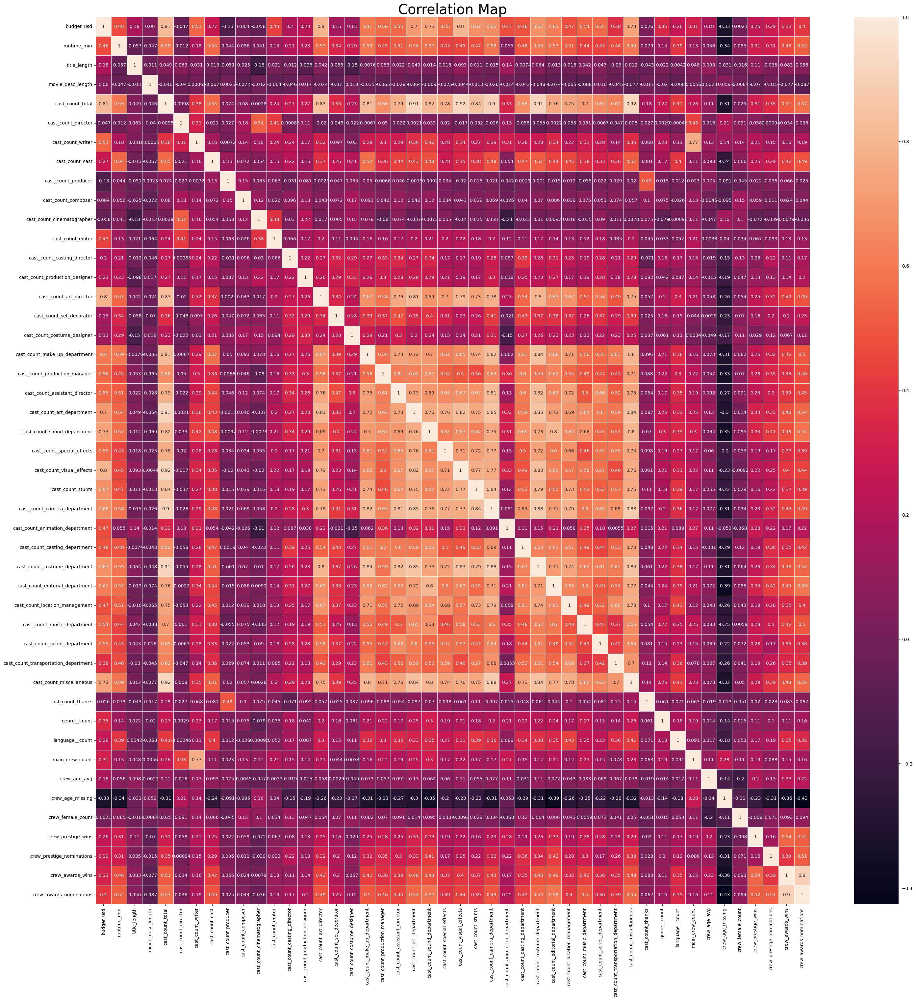

In [36]:
fig, ax = plt.subplots(figsize=(35,35))
ax.set_title("Correlation Map", fontdict={'fontsize': 30})
dataplot = sns.heatmap(X_ohe[numerical_columns].corr(), annot=True, linewidths=0.5, ax=ax)

In [37]:
print(X_ohe.columns)

Index(['genere_action', 'genere_adventure', 'genere_fantasy',
       'language_english', 'genere_comedy', 'genere_drama', 'language_spanish',
       'language_french', 'genere_horror', 'genere_thriller',
       'genere_animation', 'genere_mystery', 'genere_romance', 'genere_crime',
       'genere_sci-fi', 'genere_biography', 'genere_family', 'budget_usd',
       'runtime_min', 'title_length', 'movie_desc_length', 'cast_count_total',
       'cast_count_director', 'cast_count_writer', 'cast_count_cast',
       'cast_count_producer', 'cast_count_composer',
       'cast_count_cinematographer', 'cast_count_editor',
       'cast_count_casting_director', 'cast_count_production_designer',
       'cast_count_art_director', 'cast_count_set_decorator',
       'cast_count_costume_designer', 'cast_count_make_up_department',
       'cast_count_production_manager', 'cast_count_assistant_director',
       'cast_count_art_department', 'cast_count_sound_department',
       'cast_count_special_effects', 

In [38]:
corr_matrix = X_ohe.corr().abs()

# Create a boolean mask of highly correlated features
print(f"Number Of features before: {X_ohe.shape[1]}")
high_corr_features = np.full(corr_matrix.shape[0], False, dtype=bool)
for i in range(corr_matrix.shape[0]):
    for j in range(i+1, corr_matrix.shape[0]):
        if corr_matrix.iloc[i,j] >= 0.8:
            if not high_corr_features[j]:
                high_corr_features[i] = True

# Select the columns to keep
columns_to_drop = [column for column in X_ohe.columns if high_corr_features[X_ohe.columns.get_loc(column)]]
print(f"columns_to_drop: {columns_to_drop}")
columns_to_keep = [column for column in X_ohe.columns if not high_corr_features[X_ohe.columns.get_loc(column)]]
numerical_columns = [col for col in numerical_columns if col in columns_to_keep]
numerical_columns

# We will keep budget regardless.
#columns_to_keep.append('budget_usd')

# Create a new DataFrame with only the selected columns
X_ohe_reduced = X_ohe[columns_to_keep]
print(f"Number Of features after: {X_ohe_reduced.shape[1]}")
X_ohe_reduced.head(3)

Number Of features before: 70
columns_to_drop: ['budget_usd', 'cast_count_total', 'cast_count_art_director', 'cast_count_make_up_department', 'cast_count_assistant_director', 'cast_count_art_department', 'cast_count_sound_department', 'cast_count_visual_effects', 'cast_count_stunts', 'cast_count_camera_department', 'cast_count_costume_department', 'crew_awards_wins', 'budget_currency_EUR']
Number Of features after: 57


,genere_action,genere_adventure,genere_fantasy,language_english,genere_comedy,genere_drama,language_spanish,language_french,genere_horror,genere_thriller,...,crew_female_count,crew_prestige_wins,crew_prestige_nominations,crew_awards_nominations,rating_catg_G,rating_catg_PG-13,rating_catg_R,rating_catg_Unrated,budget_currency_CAD,budget_currency_USD
movie_id,,,,,,,,,,,,,,,,,,,,,
tt1630029,True,True,True,True,False,False,False,False,False,False,...,3,6,3,332,0,1,0,0,0,1
tt6710474,True,True,False,True,True,False,False,False,False,False,...,3,14,1,486,0,0,1,0,0,1
tt10640346,False,False,False,True,True,True,True,True,False,False,...,2,9,2,693,0,0,1,0,0,1


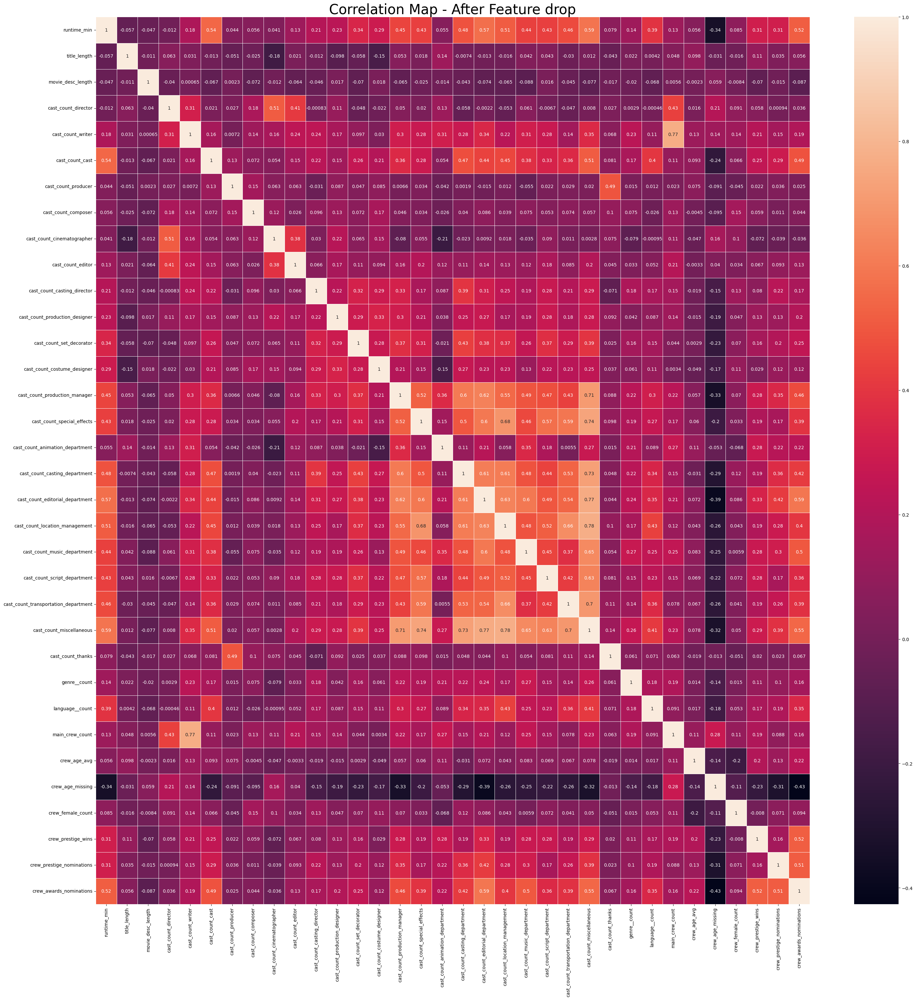

In [39]:
fig, ax = plt.subplots(figsize=(35,35))
ax.set_title("Correlation Map - After Feature drop", fontdict={'fontsize': 30})
dataplot = sns.heatmap(X_ohe_reduced[numerical_columns].corr(), annot=True, linewidths=0.5, ax=ax)

# Data Preperation - Metascore

In [40]:
import os
import math
import warnings
import itertools
from timeit import default_timer as timer

import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt

import requests
from bs4 import BeautifulSoup 
import re
import time
import progressbar

from sklearn.model_selection import cross_val_score, train_test_split,cross_validate
from sklearn.preprocessing import OneHotEncoder
from sklearn import preprocessing
from sklearn.base import clone
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import roc_curve,auc,confusion_matrix
from sklearn.impute import KNNImputer

import seaborn as sns

## Filtering out missing data

In [41]:
metascore_na_mask = y_metascore.isna()
y_meta = y_metascore[~metascore_na_mask]
X_meta = X_ohe_reduced[~metascore_na_mask]
X_meta.shape,y_meta.shape

((322, 57), (322,))

## Split Train-Test data

<br><b>Split Train-Test Data</b><br>
Since our dataset is medium sized it is best to use a standard 20% of the data as test:

In [42]:
x_train_raw, x_test_raw, y_train, y_test = train_test_split(X_meta, y_meta, train_size = 0.8, random_state=0)
print(f"Train DataSet: {x_train_raw.shape[0]} with {x_train_raw.shape[1]} features")
print(f"Test DataSet: {x_test_raw.shape[0]} with {x_test_raw.shape[1]} features")

Train DataSet: 257 with 57 features
Test DataSet: 65 with 57 features


## Scaling

<br><b>Scaling</b><br>
We will fit the scale on the training dataset then use it to transform both train and test datasets.

In [43]:
print(len(numerical_columns))
x_train_raw[numerical_columns]

34


,runtime_min,title_length,movie_desc_length,cast_count_director,cast_count_writer,cast_count_cast,cast_count_producer,cast_count_composer,cast_count_cinematographer,cast_count_editor,...,cast_count_thanks,genre__count,language__count,main_crew_count,crew_age_avg,crew_age_missing,crew_female_count,crew_prestige_wins,crew_prestige_nominations,crew_awards_nominations
movie_id,,,,,,,,,,,,,,,,,,,,,
tt14592064,95.0,2,34,2,2,42,13,1,1,3,...,0,2,1,7,49.000000,4,0,0,4,64
tt14592998,99.0,2,31,1,7,41,6,2,1,1,...,0,3,1,7,74.000000,5,1,4,1,25
tt15096128,93.0,1,27,1,2,27,18,0,0,1,...,7,2,1,6,21.500000,4,3,0,0,14
tt1798632,94.0,1,20,1,3,37,12,3,1,1,...,0,3,1,6,38.750000,2,2,0,2,57
tt12593682,127.0,2,16,1,3,86,8,1,1,1,...,2,3,4,6,38.250000,2,1,2,3,282
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
tt19595494,106.0,2,28,1,1,33,7,1,1,1,...,0,3,1,5,37.000000,4,1,0,0,5
tt4428398,98.0,7,21,3,9,44,35,1,0,1,...,21,3,1,9,64.333333,3,0,3,5,232
tt8745676,134.0,2,29,1,2,56,11,1,1,1,...,1,3,2,6,42.666667,0,3,7,0,75


In [44]:
# We will scale on the training dataset then apply it to both train and test
scalar_metascore = StandardScaler(copy=True, with_mean=True, with_std=True).fit(x_train_raw[numerical_columns])

train_scaled = pd.DataFrame(scalar_metascore.transform(x_train_raw[numerical_columns]),columns=numerical_columns)
test_scaled = pd.DataFrame(scalar_metascore.transform(x_test_raw[numerical_columns]),columns=numerical_columns)

x_train_scaled = x_train_raw.reset_index(drop=True)
x_test_scaled = x_test_raw.reset_index(drop=True)

for col in numerical_columns:
    x_train_scaled[col] = train_scaled[col].reset_index(drop=True)
    x_test_scaled[col] = test_scaled[col].reset_index(drop=True)
    
x_train_scaled.head(5).round(3)

,genere_action,genere_adventure,genere_fantasy,language_english,genere_comedy,genere_drama,language_spanish,language_french,genere_horror,genere_thriller,...,crew_female_count,crew_prestige_wins,crew_prestige_nominations,crew_awards_nominations,rating_catg_G,rating_catg_PG-13,rating_catg_R,rating_catg_Unrated,budget_currency_CAD,budget_currency_USD
0,False,False,False,True,True,False,False,False,False,False,...,-1.273,-0.543,0.709,-0.433,0,1,0,0,0,1
1,False,True,False,True,False,True,False,False,False,False,...,-0.475,1.293,-0.350,-0.736,0,1,0,0,0,1
2,False,False,False,True,True,False,False,False,False,False,...,1.120,-0.543,-0.703,-0.822,0,0,1,0,0,1
3,False,False,False,True,False,True,False,False,True,False,...,0.323,-0.543,0.003,-0.487,0,0,1,0,0,1
4,True,False,False,True,True,False,True,False,False,True,...,-0.475,0.375,0.356,1.263,0,0,1,0,0,1
